# Manuscript Figures Reproduction

This notebook reproduces the **8 primary figures** from the manuscript.


In [1]:
# Setup
import sys
import os
from pathlib import Path
import subprocess
from IPython.display import Image, display, Markdown
import warnings
warnings.filterwarnings('ignore')

# Setup for Colab
IN_COLAB = 'google.colab' in str(get_ipython())

if IN_COLAB:
    repo_url = "https://github.com/scatenag/Tomato-Salt-Tolerance-Analysis.git"
    repo_name = "Tomato-Salt-Tolerance-Analysis"
    
    if not os.path.exists(repo_name):
        !git clone {repo_url}
    os.chdir(repo_name)
    !apt-get install -y graphviz libgraphviz-dev pkg-config
    !pip install -r binder/requirements.txt
    
    project_root = Path(os.getcwd())
else:
    current_path = Path(os.getcwd())
    project_root = current_path.parent if current_path.name == 'notebooks' else current_path

print(f"✅ Setup complete")
print(f"   Project root: {project_root}")
print(f"   Python: {sys.version.split()[0]}")
print(f"   Data: {project_root / 'data' / 'master_dataset.csv'}")

✅ Setup complete
   Project root: /home/scatena/SRC/Tomato-Salt-Tolerance-Analysis
   Python: 3.12.3
   Data: /home/scatena/SRC/Tomato-Salt-Tolerance-Analysis/data/master_dataset.csv


In [2]:
# Cleanup previous results
from pathlib import Path
import os
import shutil

print("🧹 Cleaning up previous results...")
project_root = Path(os.getcwd()).parent
scripts_dir = project_root / 'scripts'

# Remove PNG, PDF, SVG, TIFF files from scripts subdirectories
for ext in ['*.png', '*.pdf', '*.svg', '*.tiff']:
    for f in scripts_dir.rglob(ext):
        if 'venv' not in str(f):
            f.unlink()
            print(f"  Removed: {f.relative_to(project_root)}")

# Remove intermediate data from data dir
data_dir = project_root / 'data'
for f in [data_dir / 'classic_pathway_activities_unified.csv', 
          data_dir / 'parameter_ranking_unified.csv',
          data_dir / 'summary_dataset_for_inspection.csv',
          scripts_dir / 'figure_03_network' / 'nodes_unified.csv',
          scripts_dir / 'figure_03_network' / 'edges_unified.csv']:
    if f.exists():
        f.unlink()
        print(f"  Removed: {f.relative_to(project_root)}")

print("✅ Cleanup complete.")


🧹 Cleaning up previous results...
  Removed: scripts/supplementary_figures/figure_S3_hormonal.png
  Removed: scripts/supplementary_figures/figure_S4_morphology.png
  Removed: scripts/supplementary_figures/figure_S1_osmotic_regulation.png
  Removed: scripts/supplementary_figures/table_S2_heatmap.png
  Removed: scripts/supplementary_figures/figure_S2_metabolism.png
  Removed: data/classic_pathway_activities_unified.csv
  Removed: data/parameter_ranking_unified.csv
  Removed: scripts/figure_03_network/nodes_unified.csv
  Removed: scripts/figure_03_network/edges_unified.csv
✅ Cleanup complete.


## Step 1: Data Unification and Human-Readable Summary

This step centralizes all analytical flows around `data/master_dataset.csv` (the single source of truth):
1. **Unification**: Derives intermediate datasets for Figures 1, 3, and 7.
2. **Summary Generation**: Creates `data/summary_dataset_for_inspection.csv` by averaging raw replicates. This file is equivalent to the legacy "DATASET_DEFINITIVO" and is used for quick human inspection.

### Methodological Note
All calculations use **all biological replicates** directly (not aggregated by DAT), because:
- Most parameters are from **destructive measurements** where each observation comes from a different plant (independent samples)
- Using all replicates provides more robust statistical inference with higher statistical power
- This is the standard approach in experimental biology publications

This ensures that the entire analysis—from raw replicates to final figures—is perfectly synchronized and statistically sound.

In [3]:
import pandas as pd
import numpy as np
import subprocess
import sys
from IPython.display import Markdown

display(Markdown("### Deriving intermediate datasets and generating human-readable summary..."))

try:
    # 1. Define absolute paths to avoid resolution errors
    # unification_script should be: /home/jovyan/scripts/unify_data_sources.py
    unification_script = project_root / "scripts" / "unify_data_sources.py"
    
    # 2. Run the unification script
    # We use sys.executable to ensure we use the same Python environment
    result = subprocess.run(
        [sys.executable, str(unification_script)], 
        capture_output=True, 
        text=True, 
        check=True,
        cwd=str(project_root) # Essential: the script needs to run from the root to find /data
    )
    print("✅ Unification complete.")
    
    # 3. Generate summary for human inspection
    master_path = project_root / 'data' / 'master_dataset.csv'
    summary_path = project_root / 'data' / 'summary_dataset_for_inspection.csv'
    
    if not master_path.exists():
        raise FileNotFoundError(f"Master dataset not found at {master_path}")
        
    df_raw = pd.read_csv(master_path)
    
    # Grouping and averaging across replicates
    id_cols = ['DAT', 'Species', 'Variety', 'Treatment', 'Phenological phase']
    numeric_cols = df_raw.select_dtypes(include=[np.number]).columns
    agg_map = {col: 'mean' for col in numeric_cols if col not in ['Reply', 'DAT']}
    
    df_summary = df_raw.groupby(id_cols).agg(agg_map).reset_index()
    
    # Save the summary
    df_summary.to_csv(summary_path, index=False)
    
    print(f"✅ Human-readable summary created: {summary_path.name}")
    print(f"   Shape: {df_summary.shape}")
    
    # Display script logs to verify what files were actually generated
    if result.stdout:
        print("\nInternal Script Logs:")
        print(result.stdout)
        
except subprocess.CalledProcessError as e:
    print(f"❌ Script Error: {e.stderr}")
except Exception as e:
    print(f"❌ Unexpected Error: {e}")

### Deriving intermediate datasets and generating human-readable summary...

✅ Unification complete.
✅ Human-readable summary created: summary_dataset_for_inspection.csv
   Shape: (216, 67)

Internal Script Logs:
Loading master data from master_dataset.csv...
✓ Unified data ready: 1173 rows (all replicates)
Generating Figure 1 intermediate data...
✓ Saved to /home/scatena/SRC/Tomato-Salt-Tolerance-Analysis/data/classic_pathway_activities_unified.csv
Generating Figure 7 intermediate data...
✓ Saved to /home/scatena/SRC/Tomato-Salt-Tolerance-Analysis/data/parameter_ranking_unified.csv
Generating Figure 3 intermediate data...
✓ Saved nodes/edges to /home/scatena/SRC/Tomato-Salt-Tolerance-Analysis/scripts/figure_03_network

✅ All intermediate data generated successfully!



In [4]:
from IPython.display import Image, display, Markdown
display(Markdown("### Data Pipeline Visualization"))
display(Markdown("The following diagram illustrates the single-source architecture of the repository:"))


display(Image(url='https://mermaid.ink/img/Z3JhcGggVEQKICAgIE1BU1RFUlsobWFzdGVyX2RhdGFzZXQuY3N2PGJyLz5SYXcgUmVwbGljYXRlcyArIEJpb1BhcmFtcyldCiAgICAKICAgICUlIFByb2Nlc3NpbmcKICAgIFVOSUZZW3NjcmlwdHMvdW5pZnlfZGF0YV9zb3VyY2VzLnB5XQogICAgU1VNTUFSWVtOb3RlYm9vazogQ3JlYXRlIFN1bW1hcnldCiAgICAKICAgICUlIEludGVybWVkaWF0ZSBEYXRhCiAgICBQX1JBTktbcGFyYW1ldGVyX3JhbmtpbmdfdW5pZmllZC5jc3ZdCiAgICBQQVRIV0FZW2NsYXNzaWNfcGF0aHdheV9hY3Rpdml0aWVzX3VuaWZpZWQuY3N2XQogICAgTkVUX0RBVEFbbm9kZXNfdW5pZmllZC5jc3YgLyBlZGdlc191bmlmaWVkLmNzdl0KICAgIFNfSU5TUFtzdW1tYXJ5X2RhdGFzZXRfZm9yX2luc3BlY3Rpb24uY3N2XQogICAgCiAgICAlJSBGaWd1cmVzCiAgICBGSUcxW0ZpZ3VyZSAxOiBQYXRod2F5cyBIZWF0bWFwXQogICAgRklHMltGaWd1cmUgMjogQWRhcHRpdmUgRGlmZnNdCiAgICBGSUczW0ZpZ3VyZSAzOiBNdWx0aS1sZXZlbCBOZXR3b3JrXQogICAgRklHNFtGaWd1cmUgNDogUGhlbm9sb2dpY2FsIFRpbWluZ10KICAgIEZJRzVbRmlndXJlIDU6IFRlbXBvcmFsIER5bmFtaWNzXQogICAgRklHNltGaWd1cmUgNjogVmFyaWV0eSBSYW5raW5nXQogICAgRklHN1tGaWd1cmUgNzogUmVzcG9uc2l2ZW5lc3NdCiAgICBGSUc4W0ZpZ3VyZSA4OiBSZWdyZXNzaW9uIEFuYWx5c2lzXQoKICAgICUlIENvbm5lY3Rpb25zCiAgICBNQVNURVIgLS0+IFVOSUZZCiAgICBNQVNURVIgLS0+IFNVTU1BUlkKICAgIAogICAgVU5JRlkgLS0+IFBfUkFOSwogICAgVU5JRlkgLS0+IFBBVEhXQVkKICAgIFVOSUZZIC0tPiBORVRfREFUQQogICAgU1VNTUFSWSAtLT4gU19JTlNQCiAgICAKICAgICUlIEZpZ3VyZSBJbnB1dHMKICAgIFBBVEhXQVkgLS0+IEZJRzEKICAgIE1BU1RFUiAtLT4gRklHMgogICAgTkVUX0RBVEEgLS0+IEZJRzMKICAgIE1BU1RFUiAtLT4gRklHNAogICAgTUFTVEVSIC0tPiBGSUc1CiAgICBNQVNURVIgLS0+IEZJRzYKICAgIFBfUkFOSyAtLT4gRklHNwogICAgTUFTVEVSIC0tPiBGSUc4CgogICAgY2xhc3NEZWYgbWFpbiBmaWxsOiNmOWYsc3Ryb2tlOiMzMzMsc3Ryb2tlLXdpZHRoOjJweDsKICAgIGNsYXNzRGVmIHByb2Nlc3MgZmlsbDojYmJmLHN0cm9rZTojMzMzLHN0cm9rZS13aWR0aDoxcHg7CiAgICBjbGFzc0RlZiByZXN1bHQgZmlsbDojYmZiLHN0cm9rZTojMzMzLHN0cm9rZS13aWR0aDoxcHg7CiAgICAKICAgIGNsYXNzIE1BU1RFUiBtYWluOwogICAgY2xhc3MgVU5JRlksU1VNTUFSWSBwcm9jZXNzOwogICAgY2xhc3MgRklHMSxGSUcyLEZJRzMsRklHNCxGSUc1LEZJRzYsRklHNyxGSUc4IHJlc3VsdDs='))
display(Markdown("""
**Analytical Steps & Transformations**

1.  **Master Dataset (Source)**: Consolidation of 1173 raw replicates across all varieties, treatments, and time points. This is the bedrock of the 'Source-Only' architecture, ensuring all derived results are perfectly reproducible from the primary measurements.
2.  **Mean Aggregation (Pre-processing)**: Raw replicates are grouped by `DAT`, `Variety`, and `Treatment`. This reduces stochastic noise and individual plant variability while preserving variety-specific responsiveness for higher-level analysis.
3.  **Figure 1 (Pathways Analysis)**: Calculation of **Induction Scores** (Fold Change T/C). Parameters are mapped to biological levels (Hormonal, Metabolic, Ionic/Osmotic, etc.). We calculate the mean ratio of Salt/Control for each variety to assess overall pathway induction or inhibition.
4.  **Figure 7 (Parameter Ranking)**: Statistical sensitivity profiling. A one-way **ANOVA** is performed to calculate F-statistics and **Eta-squared** (η²). Eta-squared represents the proportion of variance explained by the treatment, identifying which parameters are most 'responsive' to salinity regardless of the baseline.
5.  **Figure 3 (Network Analysis)**: Systems-level connectivity. We compute a **Spearman Rank Correlation** matrix across all experimental conditions. Edges are filtered by statistical significance ($p < 0.05$) and strength ($|R| > 0.3$), revealing the coordinated response between ion balance, secondary metabolism, and morphological adaptation.
"""))


### Data Pipeline Visualization

The following diagram illustrates the single-source architecture of the repository:


**Analytical Steps & Transformations**

1.  **Master Dataset (Source)**: Consolidation of 1173 raw replicates across all varieties, treatments, and time points. This is the bedrock of the 'Source-Only' architecture, ensuring all derived results are perfectly reproducible from the primary measurements.
2.  **Mean Aggregation (Pre-processing)**: Raw replicates are grouped by `DAT`, `Variety`, and `Treatment`. This reduces stochastic noise and individual plant variability while preserving variety-specific responsiveness for higher-level analysis.
3.  **Figure 1 (Pathways Analysis)**: Calculation of **Induction Scores** (Fold Change T/C). Parameters are mapped to biological levels (Hormonal, Metabolic, Ionic/Osmotic, etc.). We calculate the mean ratio of Salt/Control for each variety to assess overall pathway induction or inhibition.
4.  **Figure 7 (Parameter Ranking)**: Statistical sensitivity profiling. A one-way **ANOVA** is performed to calculate F-statistics and **Eta-squared** (η²). Eta-squared represents the proportion of variance explained by the treatment, identifying which parameters are most 'responsive' to salinity regardless of the baseline.
5.  **Figure 3 (Network Analysis)**: Systems-level connectivity. We compute a **Spearman Rank Correlation** matrix across all experimental conditions. Edges are filtered by statistical significance ($p < 0.05$) and strength ($|R| > 0.3$), revealing the coordinated response between ion balance, secondary metabolism, and morphological adaptation.


### Generating Figure 1...

✅ Figure 1 generated successfully!


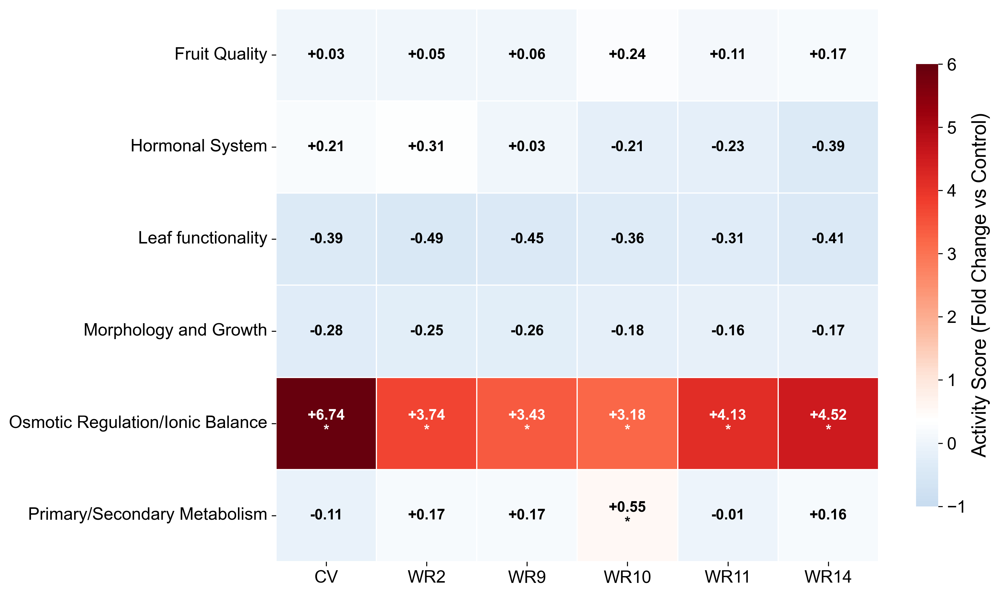


📊 Summary:
  ✓ Figure saved in PNG, SVG, and PDF formats


In [5]:
display(Markdown("### Generating Figure 1..."))

fig1_script = project_root / 'scripts' / 'figure_01_pathway_activity' / 'generate_pathway_heatmap.py'

if fig1_script.exists():
    result = subprocess.run(
        [sys.executable, str(fig1_script)],
        cwd=str(project_root / 'scripts' / 'figure_01_pathway_activity'),
        capture_output=True,
        text=True,
        timeout=120
    )
    
    if result.returncode == 0:
        print("✅ Figure 1 generated successfully!")
        fig_path = project_root / 'scripts' / 'figure_01_pathway_activity' / 'figure_01_pathway_activity_heatmap.png'
        if fig_path.exists():
            display(Image(filename=str(fig_path), width=800))
        # Show output summary
        if result.stdout:
            print("\n📊 Summary:")
            for line in result.stdout.split('\n')[-10:]:
                if line.strip() and ('✅' in line or 'Figure' in line or '✓' in line):
                    print(f"  {line}")
    else:
        print("❌ Error:")
        print(result.stderr[-1000:])

## Figure 2: Adaptive Differences (WR vs CV) by Biological System

> **Dataset:** `data/master_dataset.csv`

**Key Features:**
- Horizontal layout: 6 biological systems as ROWS, parameters as COLUMNS
- **Formula**: (WR_mean - CV_mean) / |CV_mean|
- Color: Blue (CV better) - White (equal) - Red (WR better)
- Range: -1.0 to +1.0
- Significance markers: * (>0.3), ** (>0.5), *** (>1.0)
- All 43 parameters included with real data
- **Parameter acronyms** (22pt bold font) for clarity
- **Horizontal colorbar legend** at bottom showing scale interpretation:
  - Blue side: "CV > WR" 
  - Red side: "WR > CV"

**Biological Systems:**
1. Hormonal system (8 parameters)
2. Primary/secondary metabolism (7 parameters)
3. Osmotic regulation/ionic balance (6 parameters)
4. Leaf functionality (2 parameters)
5. Morphology and growth (11 parameters)
6. Fruit quality (9 parameters)

**Varieties:** WR2, WR9, WR10, WR11, WR14 vs CV

### Generating Figure 2...

✅ Figure 2 generated successfully!


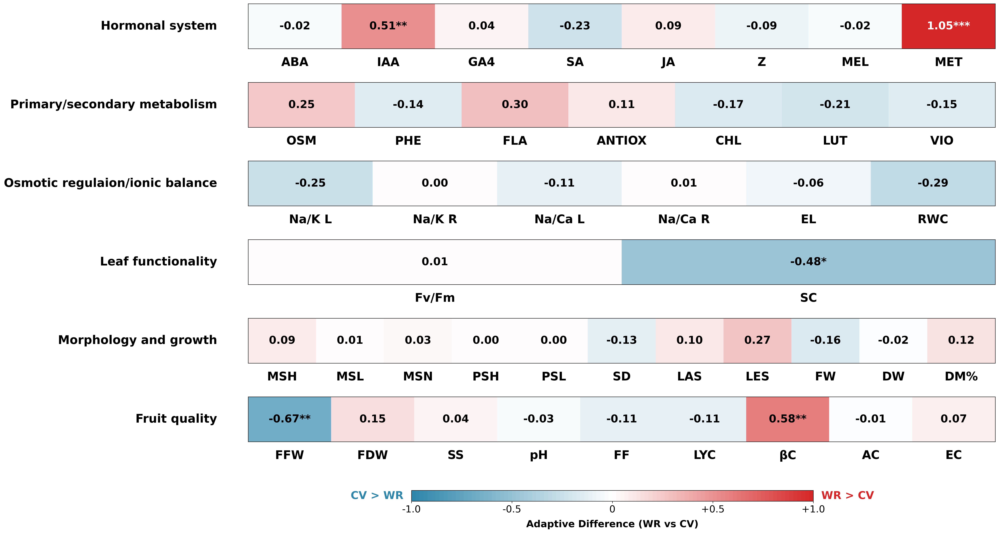


📊 Displayed: figure_02_adaptive_differences.png

Summary:
  ✅ Calculated 43 adaptive differences
  ✅ FIGURE 2 COMPLETED!


In [6]:
display(Markdown("### Generating Figure 2..."))

fig2_script = project_root / 'scripts' / 'figure_02_adaptive_differences' / 'generate_figure_02.py'

if fig2_script.exists():
    result = subprocess.run(
        [sys.executable, str(fig2_script)],
        cwd=str(fig2_script.parent),
        capture_output=True,
        text=True,
        timeout=180
    )
    
    if result.returncode == 0:
        print("✅ Figure 2 generated successfully!")
        
        # Display the generated PNG
        png_file = fig2_script.parent / 'figure_02_adaptive_differences.png'
        if png_file.exists():
            display(Image(filename=str(png_file), width=1200))
            print(f"\n📊 Displayed: {png_file.name}")
            
            # Show summary
            if result.stdout:
                print("\nSummary:")
                for line in result.stdout.split('\n'):
                    if '✅' in line:
                        print(f"  {line}")
        else:
            print(f"⚠️ PNG file not found: {png_file}")
    else:
        print("❌ Error:")
        print(result.stderr[-500:])
else:
    print(f"⚠️ Script not found: {fig2_script}")

## Figure 3: Integrated Multi-Level Biological Network

> **Datasets:** `nodes_unified.csv` and `edges_unified.csv` (derived from primary data)

**Key Features:**
- Multi-level network integrating ionomics, metabolomics, and phenomics.
- Intra-level and cross-level biological relationships.
- **Generation:** Produced using R (`generate_network_PUBLICATION_FINAL.R`).

### Generating Figure 3...

🚀 Running R script: generate_network_PUBLICATION_FINAL.R...
✅ Figure 3 generated successfully!


#### Version WITH Intra-level connections (green)

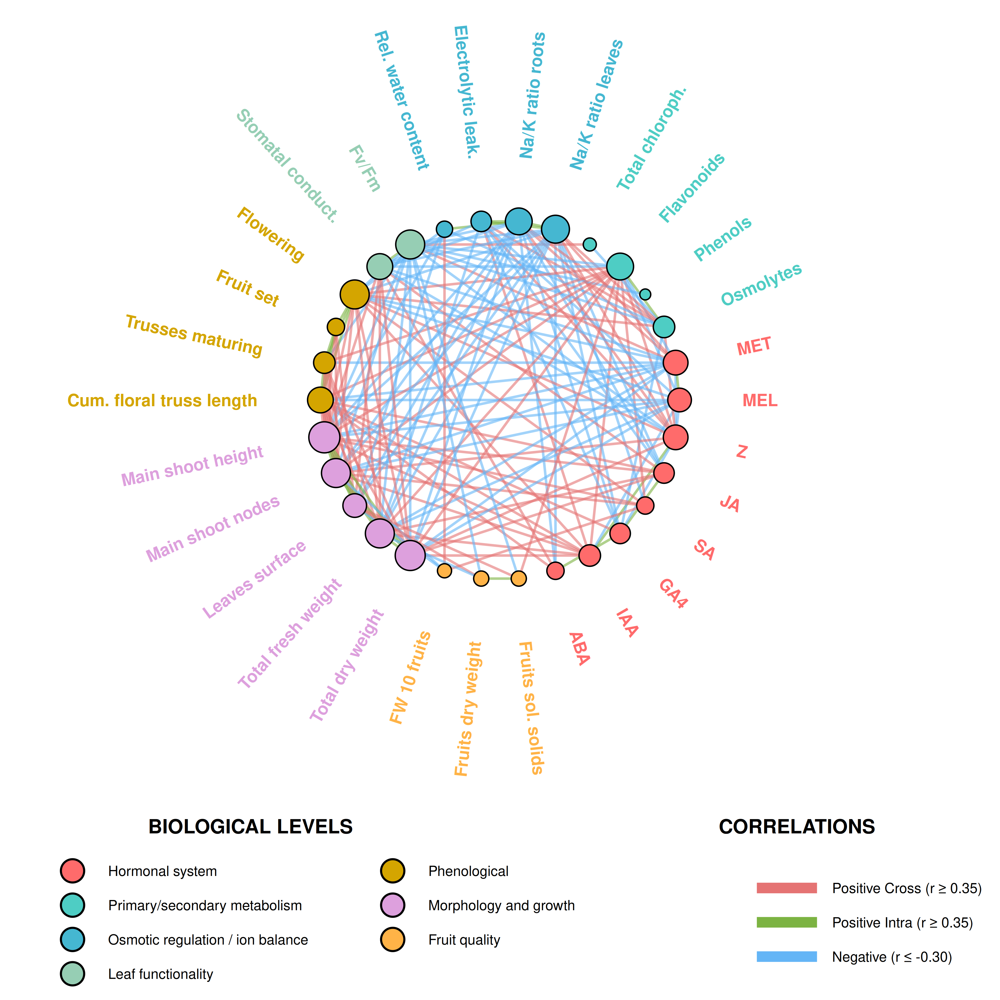

✅ Displayed: Figure_03_network_EXACT.png


#### Version WITHOUT Intra-level (cross-level only)

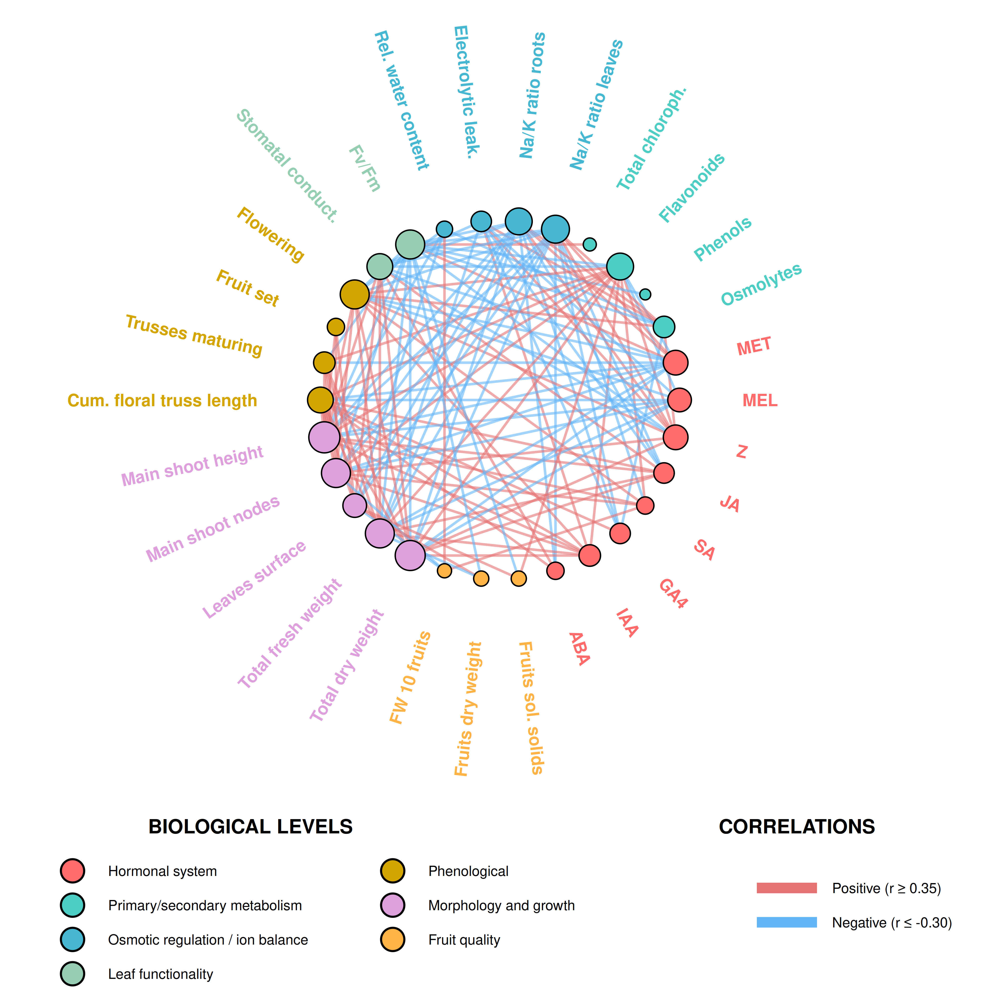

✅ Displayed: Figure_03_network_CROSS_LEVEL_ONLY.png


In [7]:
display(Markdown("### Generating Figure 3..."))

# Define paths
fig3_r_script = project_root / 'scripts' / 'figure_03_network' / 'generate_network_PUBLICATION_FINAL.R'
fig3_with_intra = fig3_r_script.parent / 'Figure_03_network_EXACT.png'
fig3_cross_only = fig3_r_script.parent / 'Figure_03_network_CROSS_LEVEL_ONLY.png'

if fig3_r_script.exists():
    # Run the R script
    print(f"🚀 Running R script: {fig3_r_script.name}...")
    result = subprocess.run(["Rscript", str(fig3_r_script.name)], 
                           cwd=str(fig3_r_script.parent),
                           capture_output=True, text=True)
    
    if result.returncode == 0:
        print("✅ Figure 3 generated successfully!")
        
        if fig3_with_intra.exists():
            display(Markdown("#### Version WITH Intra-level connections (green)"))
            display(Image(filename=str(fig3_with_intra), width=1000))
            print(f"✅ Displayed: {fig3_with_intra.name}")
        
        if fig3_cross_only.exists():
            display(Markdown("#### Version WITHOUT Intra-level (cross-level only)"))
            display(Image(filename=str(fig3_cross_only), width=1000))
            print(f"✅ Displayed: {fig3_cross_only.name}")
    else:
        print("❌ Error generating Figure 3:")
        print(result.stderr)
else:
    print(f"⚠️ R script not found: {fig3_r_script}")


In [8]:
import ipywidgets as widgets
from IPython.display import display, Image, clear_output, Markdown

display(Markdown("### Interactive Figure 3: Correlation Network Thresholding"))

# Configuration for Figure 3
fig3_r_script = project_root / 'scripts' / 'figure_03_network' / 'generate_network_PUBLICATION_FINAL.R'

def generate_interactive_network(threshold_pos, threshold_neg):
    # Run the R script with arguments
    result = subprocess.run(
        ["Rscript", str(fig3_r_script.name), str(threshold_pos), str(threshold_neg)], 
        cwd=str(fig3_r_script.parent),
        capture_output=True, text=True
    )
    
    if result.returncode == 0:
        fig3_path = fig3_r_script.parent / 'Figure_03_network_EXACT.png'
        if fig3_path.exists():
            display(Image(filename=str(fig3_path), width=600))
        else:
            print("❌ Image not generated.")
    else:
        print("❌ Error generating Figure 3:")
        print(result.stderr)

# Create widgets
pos_slider = widgets.FloatSlider(
    value=0.7, min=0.1, max=0.9, step=0.05, 
    description='Pos Threshold (r ≥):', 
    style={'description_width': 'initial'}, 
    layout={'width': '400px'}
)
neg_slider = widgets.FloatSlider(
    value=-0.70, min=-0.9, max=-0.1, step=0.05, 
    description='Neg Threshold (r ≤):', 
    style={'description_width': 'initial'}, 
    layout={'width': '400px'}
)

# Use interactive to link sliders to function
ui = widgets.HBox([pos_slider, neg_slider])
out = widgets.interactive_output(generate_interactive_network, {
    'threshold_pos': pos_slider, 
    'threshold_neg': neg_slider
})

display(ui, out)


### Interactive Figure 3: Correlation Network Thresholding

Output()

## Figure 4: Phenological Timing Analysis (GDD-Based)

> **Dataset:** `data/master_dataset.csv`

**Part a:** GDD Cumulative Heatmap
- Y-axis: 18 variety-treatment combinations (6 varieties × 3 treatments)
- X-axis: 4 phenological phases (Vegetative, Flowering, Fruit set, Fruit ripening)
- Color: Yellow-Orange-Red gradient (YlOrRd)
- Values: Cumulative GDD shown inside cells
- Range: 250-950 GDD
- White separation lines between rows

**Part b:** Phenological Delay Scatter Plot
- X-axis: Delay (%) relative to control
- Y-axis: Indexed positions (0-12)
- Points colored by treatment (S1=orange, S2=red)
- Labels positioned next to points
- Reference line at x=0

**Data Source:** Real phenological data from master_dataset.csv

### Generating Figure 4...

✅ Figure 4 generated successfully!


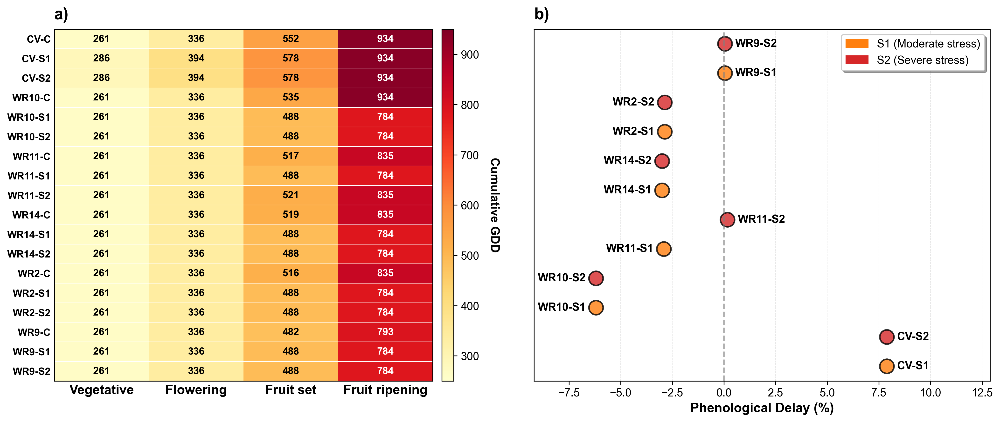


📊 Displayed: figure_04_phenological_timing.png

Summary:
  ✓ Master dataset loaded: 1173 rows
     ✓ Data loaded for 6 varieties
     ✓ Effects calculated for 6 varieties
  ✅ PNG: /home/scatena/SRC/Tomato-Salt-Tolerance-Analysis/scripts/figure_04_phenological_timing/figure_04_phenological_timing.png
  ✅ PDF: /home/scatena/SRC/Tomato-Salt-Tolerance-Analysis/scripts/figure_04_phenological_timing/figure_04_phenological_timing.pdf
  ✅ COMPLETED!


In [9]:
display(Markdown("### Generating Figure 4..."))

fig4_script = project_root / 'scripts' / 'figure_04_phenological_timing' / 'generate_figure_04.py'

if fig4_script.exists():
    result = subprocess.run(
        [sys.executable, str(fig4_script)],
        cwd=fig4_script.parent,
        capture_output=True,
        text=True,
        timeout=180
    )
    
    if result.returncode == 0:
        print("✅ Figure 4 generated successfully!")
        
        png_file = fig4_script.parent / 'figure_04_phenological_timing.png'
        if png_file.exists():
            display(Image(filename=str(png_file), width=1000))
            print(f"\n📊 Displayed: {png_file.name}")
            
            # Show summary
            if result.stdout:
                print("\nSummary:")
                for line in result.stdout.split('\n'):
                    if '✓' in line or '✅' in line:
                        print(f"  {line}")
    else:
        print("❌ Error:")
        print(result.stderr[-500:])
else:
    print(f"⚠️ Script not found: {fig4_script}")

## Figure 5: Temporal Dynamics of Phenological Development

> **Dataset:** `data/master_dataset.csv`

**Key Features:**
- 12-panel figure (4 rows × 3 columns)
- X-axis: DAT (Days After Transplant) - **global limit 0-103** based on maximum DAT across all data (98)
- Three treatment conditions per metric (Control, Moderate stress, Severe stress)
- 6 varieties per panel with distinct colors
- Line plots with shaded error bands (mean ± SE)
- **Data source**: Uses raw replicates data (`raw_replicates_phenological.csv`) for complete temporal coverage
- **Significance asterisks BELOW X-axis** (colored by variety) indicating WR varieties significantly different from CV
- **Uniform Y-scale** per metric row (same limits across treatments)
- **Y-axis labels** only in first column (cleaner layout)
- **Legend** only in first row (panels a, b, c)
- **Missing data handling**: NaN values at DAT 56, 66, 71 for "Trusses maturing" (when no ripe fruits were recorded) are interpreted as 0 for continuity

**DAT 98 exclusion logic:**
- **Main shoot height & Flowering**: Include DAT 98 (valid growth/flowering data)
- **Fruit set & Fruit ripening**: Exclude DAT 98 (values return to 0 after destructive sampling at DAT 77)

**Font sizes (increased for publication):**
- X-axis label (DAT): 20pt bold
- Y-axis labels: 18pt bold
- Panel titles (a, b, c...): 20pt bold
- Treatment column titles: 22pt bold
- Tick labels: 16pt
- Legend: 18pt

**Panels:**
- **a-c:** Main shoot height (cm) - continuous growth, data through DAT 98
- **d-f:** Flowering (trusses number) - continuous accumulation, data through DAT 98
- **g-i:** Fruit set (trusses number) - peak at DAT 77, DAT 98 excluded
- **l-n:** Fruit ripening (trusses number) - continuous from 0, peak at DAT 77, DAT 98 excluded

**Variety Colors:**
- CV: Black (thicker line, 3.5pt) - Reference
- WR2: Red (asterisks row 1)
- WR9: Cyan (asterisks row 2)
- WR10: Green (asterisks row 3)
- WR11: Goldenrod (asterisks row 4)
- WR14: Purple (asterisks row 5)

**Statistics:** Welch's t-test (WR vs CV) with Bonferroni correction (×5)
- Asterisks positioned below X-axis in dedicated rows per variety
- Each variety's asterisks appear in its own row, colored to match the line
- Significance levels: * p<0.05, ** p<0.01, *** p<0.001

### Generating Figure 5...

✅ Figure 5 generated successfully!


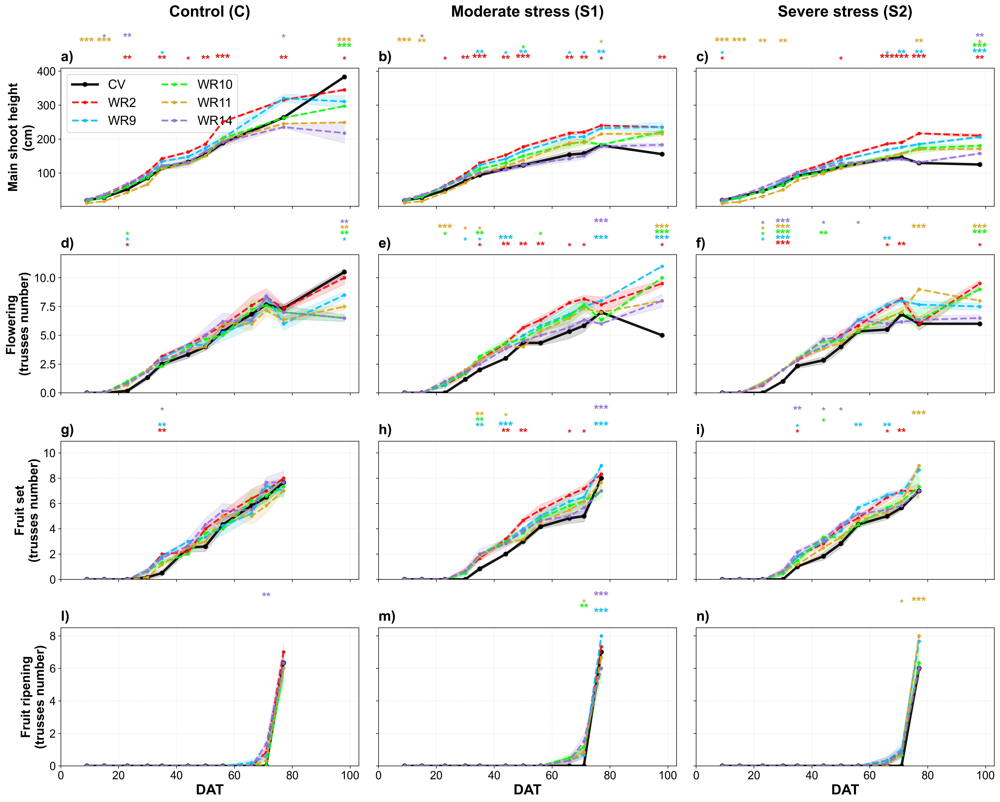


📊 Displayed: figure_05_temporal_dynamics.png

Summary:
  ✅ PNG: /home/scatena/SRC/Tomato-Salt-Tolerance-Analysis/scripts/figure_05_temporal_dynamics/figure_05_temporal_dynamics.png


In [10]:
display(Markdown("### Generating Figure 5..."))

fig5_script = project_root / 'scripts' / 'figure_05_temporal_dynamics' / 'generate_figure_05.py'

if fig5_script.exists():
    result = subprocess.run(
        [sys.executable, str(fig5_script)],
        cwd=fig5_script.parent,
        capture_output=True,
        text=True,
        timeout=300
    )
    
    if result.returncode == 0:
        print("✅ Figure 5 generated successfully!")
        
        png_file = fig5_script.parent / 'figure_05_temporal_dynamics.png'
        if png_file.exists():
            display(Image(filename=str(png_file), width=1400))
            print(f"\n📊 Displayed: {png_file.name}")
            
            # Show summary
            if result.stdout:
                print("\nSummary:")
                for line in result.stdout.split('\n'):
                    if '✅' in line and 'PNG' in line:
                        print(f"  {line}")
    else:
        print("❌ Error:")
        print(result.stderr[-500:])
else:
    print(f"⚠️ Script not found: {fig5_script}")

## Figure 6: Variety Ranking and Category Contribution

> **Dataset:** `data/master_dataset.csv`

**Panel a:** Final Stress Tolerance Ranking - Simple horizontal bars with total scores  
**Panel b:** Category Contribution - Stacked bars (Performance/Maintenance/Physiological/Stress Marker)

**Modifications:**
- X-axis label: "Score" (not "Punteggio Composito")
- Variety colors consistent with Figure 5: CV=black, WR2=red, WR9=cyan, WR10=green, WR11=goldenrod (#DAA520), WR14=purple
- Legend font size increased to 16pt
- Horizontal legend at bottom

**Data Source:** Calculated from real dataset (master_dataset.csv)

### Generating Figure 6...

✅ Figure 6 generated successfully!
   Data: CALCULATED from real dataset


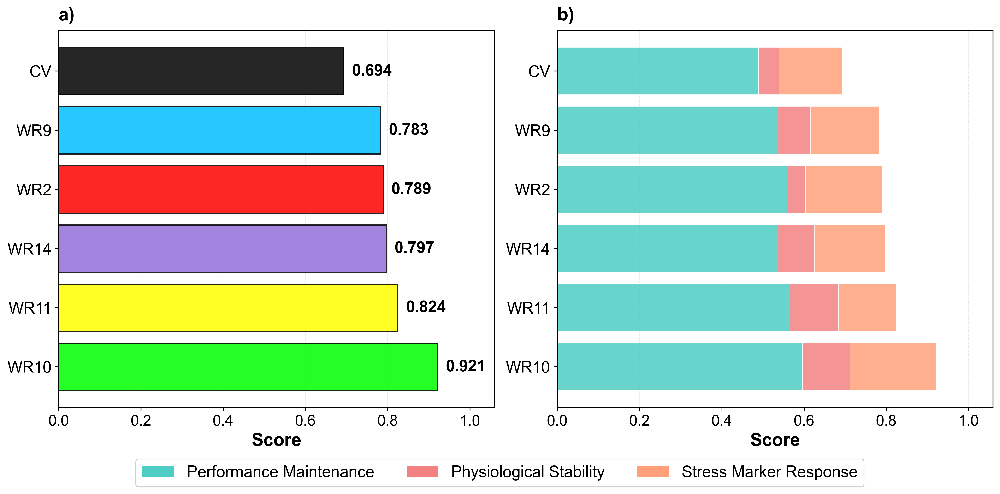


📊 Displayed: figure_06_variety_ranking.png

Ranking calculated:
      TOTALE: 0.694
      TOTALE: 0.789
      TOTALE: 0.783
      TOTALE: 0.921
      TOTALE: 0.824
      TOTALE: 0.797


In [11]:
display(Markdown("### Generating Figure 6..."))

fig6_script = project_root / "scripts" / "figure_06_variety_ranking" / "generate_figure_06.py"

if fig6_script.exists():
    result = subprocess.run(
        [sys.executable, str(fig6_script)],
        cwd=fig6_script.parent,
        capture_output=True,
        text=True,
        timeout=180
    )
    
    if result.returncode == 0:
        print("✅ Figure 6 generated successfully!")
        print("   Data: CALCULATED from real dataset")
        
        png_file = fig6_script.parent / "figure_06_variety_ranking.png"
        if png_file.exists():
            display(Image(filename=str(png_file), width=1000))
            print(f"\n📊 Displayed: {png_file.name}")
            
            # Show ranking
            if result.stdout:
                print("\nRanking calculated:")
                for line in result.stdout.split("\n"):
                    if "TOTALE:" in line:
                        print(f"  {line}")
    else:
        print("❌ Error:")
        print(result.stderr[-500:])
else:
    print(f"⚠️ Script not found: {fig6_script}")

## Figure 7: Parameter Responsiveness Heatmap by Category

> **Dataset:** `data/parameter_ranking_unified.csv` (derived from primary data)

**Key Features:**
- Two-panel figure: WR10 (best wild) and CV (cultivated)
- Parameters grouped by category (Performance, Stability, Stress Marker)
- Normalized scores (0-100) based on F-statistic, Eta-squared, and % Change

### Generating Figure 7...

✅ Figure 7 generated successfully!


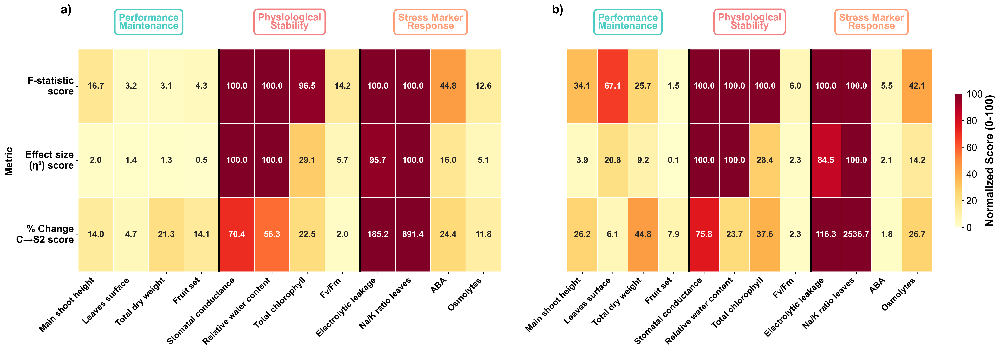


📊 Displayed: figure_07_parameter_responsiveness.png


In [12]:
display(Markdown("### Generating Figure 7..."))

fig7_script = project_root / "scripts" / "figure_07_responsiveness" / "generate_figure_07.py"

if fig7_script.exists():
    result = subprocess.run(
        [sys.executable, str(fig7_script)],
        cwd=fig7_script.parent,
        capture_output=True,
        text=True,
        timeout=180
    )
    
    if result.returncode == 0:
        print("✅ Figure 7 generated successfully!")
        
        png_file = fig7_script.parent / "figure_07_parameter_responsiveness.png"
        if png_file.exists():
            display(Image(filename=str(png_file), width=1400))
            print(f"\n📊 Displayed: {png_file.name}")
    else:
        print("❌ Error:")
        print(result.stderr[-500:])
else:
    print(f"⚠️ Script not found: {fig7_script}")

## Figure 8: Regression Comparison (WR10 vs CV)

> **Dataset:** `data/master_dataset.csv`

**Key Features:**
- 3-panel comparison showing dose-response relationships
- Linear regression (panels a, b) and exponential regression (panel c)
- WR10 (S. pimpinellifolium) vs CV (S. lycopersicum)
- Salinity gradient: Control (3.22 mS/cm), S1 (11.0 mS/cm), S2 (21.0 mS/cm)

**Panels:**
- **a)** Main Shoot Height (cm) - Performance Maintenance
- **b)** Stomatal Conductance (% of control) - Physiological Stability  
- **c)** Electrolytic Leakage (µS/cm) - Stress Marker Response

**Statistics:** 
- R² values for model fit quality
- Confidence intervals shown as shaded regions
- Category colors match Figure 7: Cyan, Pink, Orange

**Data Source:** Real physiological data from master_dataset.csv

### Generating Figure 8...

✅ Figure 8 generated successfully!


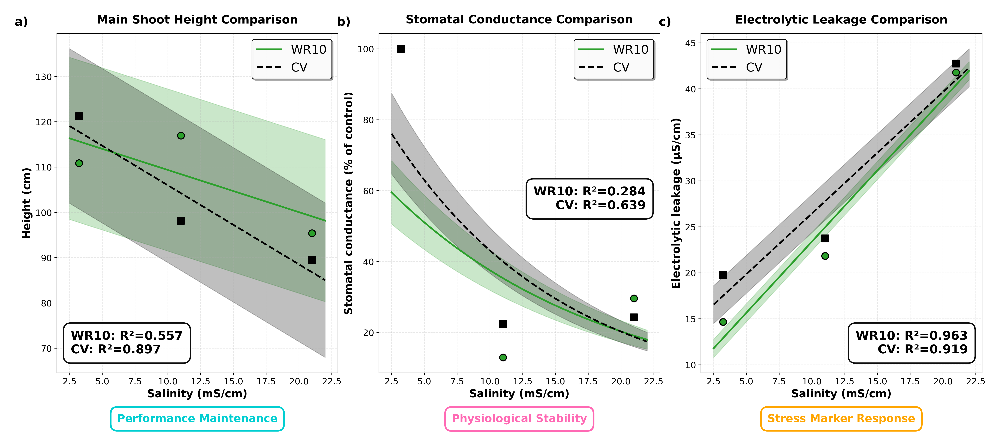


📊 Displayed: figure_08_regression_comparison.png


In [13]:
display(Markdown("### Generating Figure 8..."))

fig8_script = project_root / 'scripts' / 'figure_08_regression_comparison' / 'generate_figure_08.py'

if fig8_script.exists():
    result = subprocess.run(
        [sys.executable, str(fig8_script)],
        cwd=fig8_script.parent,
        capture_output=True,
        text=True,
        timeout=180
    )
    
    if result.returncode == 0:
        print("✅ Figure 8 generated successfully!")
        
        png_file = fig8_script.parent / 'figure_08_regression_comparison.png'
        if png_file.exists():
            display(Image(filename=str(png_file), width=1000))
            print(f"\n📊 Displayed: {png_file.name}")
    else:
        print("❌ Error:")
        print(result.stderr[-500:])

## Summary

All 8 manuscript figures have been successfully generated from the **single unified master dataset**.

### Key Reproducibility Features:
- ✅ **Single Source of Truth**: All analyses start from `data/master_dataset.csv`.
- ✅ **Integrated Replicates**: Scripts for Figures 4 and 5 utilize raw replicates for error calculation and testing directly from the master file.
- ✅ **Automatic Consistency**: Figures 1, 3, and 7 use intermediate data derived dynamically from the same source.
- ✅ **Human Inspection**: A simplified summary dataset is generated on-the-fly for quick validation.
- ✅ **Verification**: All statistical methods (Welch's t-tests, Bonferroni corrections) are applied consistently across genotypes.

### Repository Organization:
- `data/`: Contains the single master input and derived unified summaries.
- `scripts/`: Modular figure generation logic, now fully independent and synchronized.

**End-to-End Transparency**: The transition from raw data points to complex multi-level biological networks and rankings is now fully automated and documented.